This pipeline opens the result of fsl's melodic analysis, lets the user interactively label the components that look like neuronal activity (rather than movement artefacts or noise), sort them by label, plots a final summary for the chosen components, and save the reordered maps and time series.

In [1]:
clear all

In [2]:
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy import io
import scipy.io as sio
%matplotlib inline 
import pylab
import csv
from Tkinter import Tk
from tkFileDialog import askopenfilename
from tkFileDialog import askdirectory
import nibabel as nb
from scipy import io
from nifti import NiftiImage
import nibabel as nb

ImportError: No module named nifti

Open time series

In [71]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
from Tkinter import Tk
from tkFileDialog import askopenfilename

Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename)

/media/sophie2/100150/100150ss1cregc72Smith0_4_60TS.mat


In [72]:
Ua=sio.loadmat(filename)
DT=Ua['TSo']
DT.shape

(6294, 72)

Open maps

In [73]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
from Tkinter import Tk
from tkFileDialog import askopenfilename

Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename2 = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename2)

/media/sophie2/100150/100150ss1cregc72Smith0_4_60IC.nii


In [74]:
img1 = nb.load(filename2)
data = img1.get_data()
S=data.shape
S

(87, 55, 36, 72)

#Open time

In [75]:
Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename)

/home/sophie/Downloads/Data100150_.csv


In [76]:
with open(filename) as inputfile:
    results = list(csv.reader(inputfile))

In [77]:
Raw_timea=[float(results[i][2]) for i in (range(1,len(results)))]

In [78]:
Raw_time=np.asarray(Raw_timea[0:len(results)])

In [79]:
Raw_time.shape

(6484,)

First and last frames in which excitation is full on

In [12]:
on=126
off=6253
Time_fluo=Raw_time[on:off]-Raw_time[on]

In [13]:
Time_fluo.shape

(6127,)

In [168]:
Time_fluo

array([  0.00000000e+00,   1.99980000e-02,   4.00010000e-02, ...,
         1.22513248e+02,   1.22533252e+02,   1.22553256e+02])

# Stimulus time series

In [96]:
Tmax=np.max(Time_fluo)
Tstim=np.array(range(1,100*(int(Tmax)+1)))
Tstim=Tstim/100
Odor=np.zeros(len(Tstim*100))
UV=np.zeros(len(Tstim*100))

In [97]:
for i in range(0,7):
    UV[10*100+i*600:100*10+i*600+300]=1
    
for i in range(0,5):    
    Odor[(10+8*6+15)*100+i*600:(10+8*6+15)*100+i*600+200]=1
UV[UV==0]=np.nan
Odor[Odor==0]=np.nan

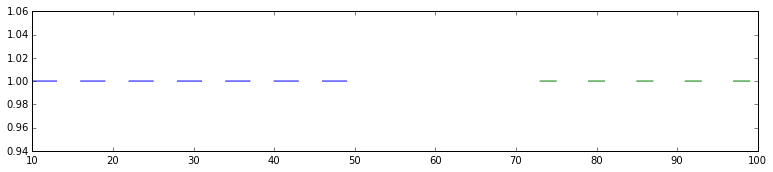

In [98]:
plt.plot(Tstim,UV)
plt.plot(Tstim,Odor)

# Behavior

* Cut the behavior movies to keep only frames with excitation on
* Analyze the behavior by hand (using Video_annotate) or measuring the ball movement with PIV (in FIJI)
* Extract time embedded in the movies, using avi2time

In [17]:
Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename)
B=sio.loadmat(filename)

/media/Seagate Backup Plus Drive/964/964vid/matlab.mat


In [92]:
Tb=B['T'].T
Left=B['green'].T
Right=B['blue'].T
Leftn=Left/np.max(Left)
Rightn=Left/np.max(Right)
Leftb=Leftn
Leftb[Leftn>0.2]=1
Leftb[Leftn<0.2]=np.nan
Rightb=Rightn
Rightb[Rightn>0.2]=1
Rightb[Rightn<0.2]=np.nan

In [93]:
Left.shape

(12117, 1)

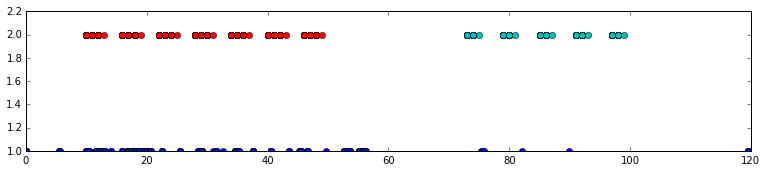

In [103]:
plt.plot(Tb,Rightb, marker='o')
plt.plot(Tb,Leftb)
plt.plot(Tstim,UV+1, marker='o')
plt.plot(Tstim,Odor+1,marker='o')

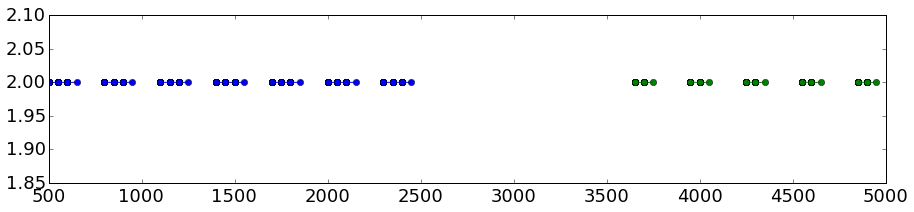

In [170]:
pylab.rcParams['figure.figsize'] = (15, 3)
plt.plot(Tstim/0.02,UV+1, marker='o')
plt.plot(Tstim/0.02,Odor+1,marker='o')

In [22]:
%store

Stored variables and their in-db values:


# Zscore maps

In [80]:
Demean=np.zeros(S)
Dmaps=np.zeros(S)
Dvar=np.zeros(S)
Var=np.zeros(S[3])
D2=np.zeros([S[0],S[1],5,S[3]])
Tvar=np.zeros(S[3])

Transform the maps to have zero mean

In [81]:
for i in range(S[3]):
    Demean[:,:,:,i]=data[:,:,:,i]-np.mean(np.mean(np.mean(data[:,:,:,i],0),0),0)

Transform the maps to have unit variance and zscore

In [82]:
for i in range(S[3]):
    Dsq=np.reshape(Demean[:,:,:,i],S[0]*S[1]*S[2])
    Var[i]=np.sqrt(np.var(Dsq))
    Dvar=Demean[:,:,:,i]/Var[i]
    Dmaps[:,:,:,i]=Dvar-2
    Tvar[i]=np.var(DT[i,:])
Dmaps[Dmaps<0]=0

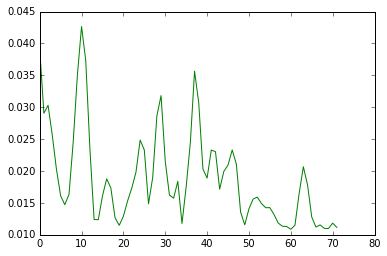

In [83]:
plt.plot(Tvar,'g')
#plt.plot(Var)

Order ICs by variance before normalization if ICA done in matlab

In [84]:
Order=np.argsort(Var)[::-1]
datao=data[:,:,:,Order[:]]
Dmapso=Dmaps[:,:,:,Order[:]]
Varor=Var[Order]

# Open time series from ROI and unmixed in ROI

In [85]:
Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename)
B=sio.loadmat(filename)

/media/sophie2/100150/100150ss1cregc72Smith0_4_60TSzmap.mat


In [86]:
TS_ROI=B['TSzmapo']

The following code is very slow. Need to parallelize here or in matlab with parfor. 

In [20]:
TS_ROI=np.zeros([S[3],So[0]])
for j in range(S[3]):
    for k in range(So[0]):
        TS_ROI[j][k]=sum(sum(sum(sum([Do[k][:][:][:]*Dmaps[:,:,:,j].T]))))
    A=TS_ROI[j][:]
    V=np.sqrt(np.var(A))
    TS_ROI[j][:]=A/V

NameError: name 'So' is not defined

#Separate maps in substacks, sort the independent components by brain regions 

In [87]:
my_cmap=plt.cm.jet
my_cmap.set_bad(alpha=0)
Good_ICs=np.zeros(S[3])
Label_ICs=[]
pylab.rcParams['figure.figsize'] = (13, 2.5)

In [88]:
Tk().withdraw() 
filenamet = askopenfilename() 
print(filenamet)
nimt=NiftiImage(filenamet)
Dtemp=np.squeeze(nimt.data.T)
Dtemp.shape

NameError: name 'NiftiImage' is not defined

In [89]:
Dtemp=np.mean(data,3)

In [90]:
Dtemp.shape

(87, 55, 36)

In [91]:
%%javascript
IPython.OutputArea.auto_scroll_threshold =4000;

<IPython.core.display.Javascript object>

In [92]:
if S[2]>5:
    Nstack=5
    Int100=[(i+1)*100/Nstack for i in range(Nstack)]
    Percs=np.percentile(range(S[2]),Int100)
    Indices=np.split(range(S[2]),Percs)
    D1=np.zeros([S[0],S[1],Nstack])
    Dmean=np.squeeze(data[:,:,range(Nstack),2])
    for i in range(Nstack):
        Vmean=np.mean(Dtemp[:,:,Indices[i]],2)
        Dmean[:,:,i]=Vmean
else:
    Nstack=S[2]
    D1=np.zeros([S[0],S[1],S[2]])
    Dmean=data[:,:,range(S[2])]  
    Dmean=np.squeeze(Dtemp[:,:,:])

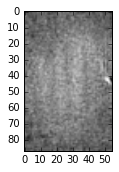

In [93]:
plt.imshow(Dmean[:,:,1],cmap=plt.cm.gray)

In [94]:
Dmean.shape

(87, 55, 5)

In [95]:
Nstack

5

0


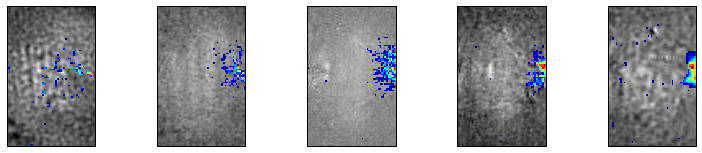

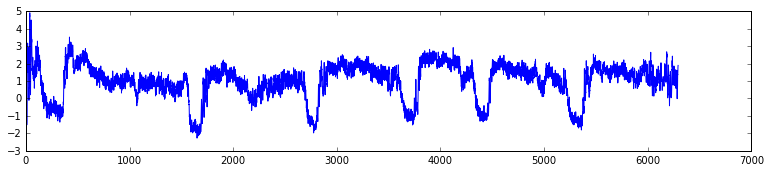


1


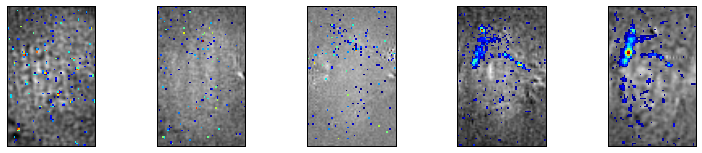

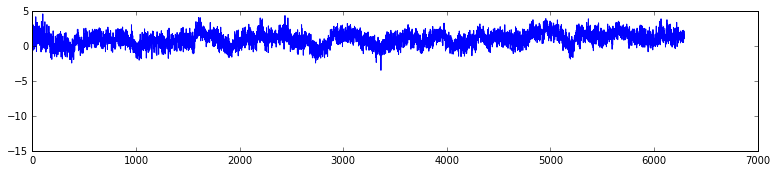

a
2


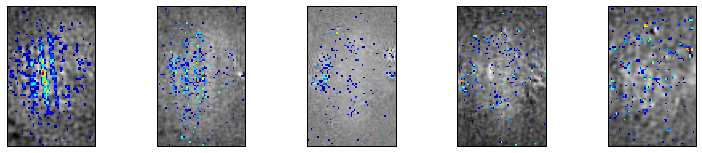

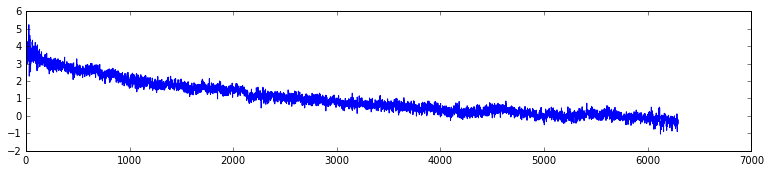


3


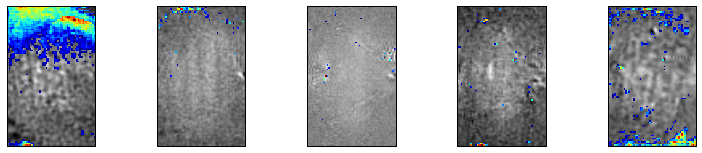

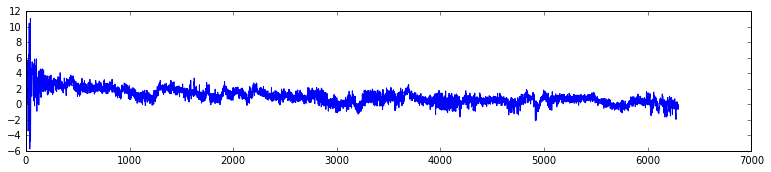


4


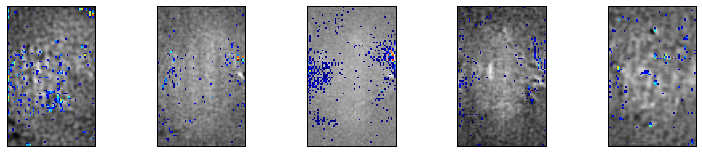

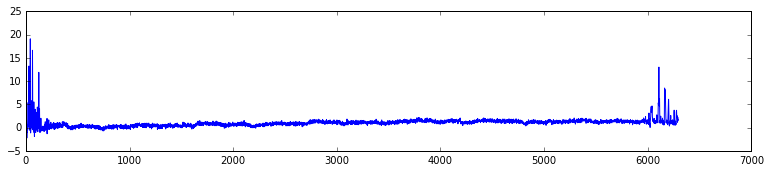


5


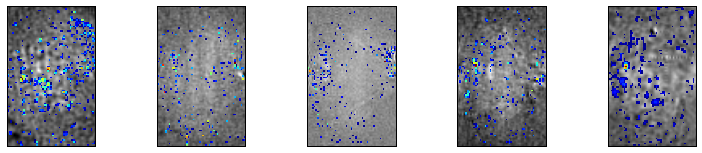

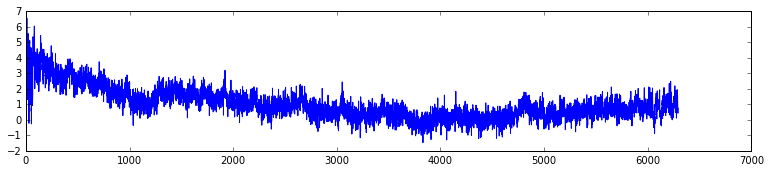


6


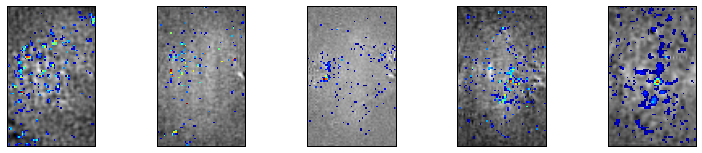

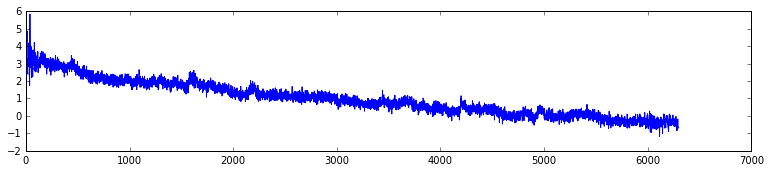


7


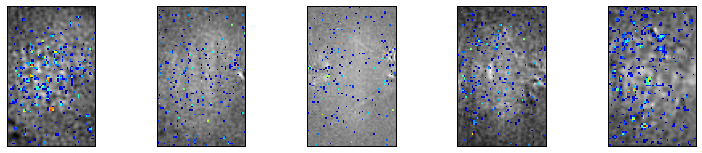

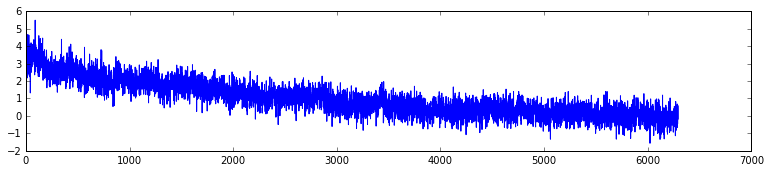


8


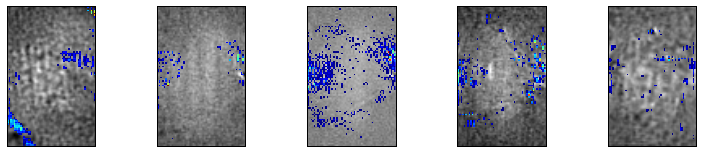

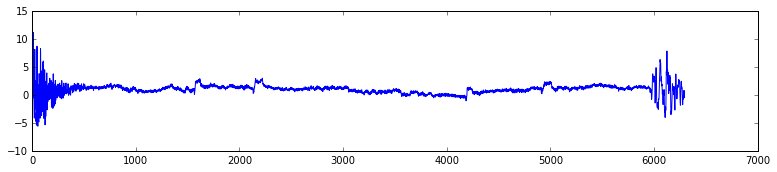


9


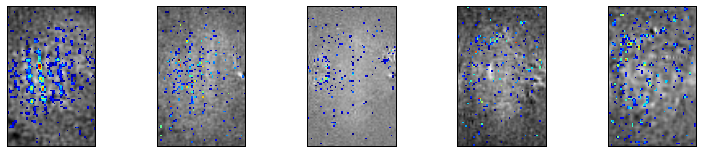

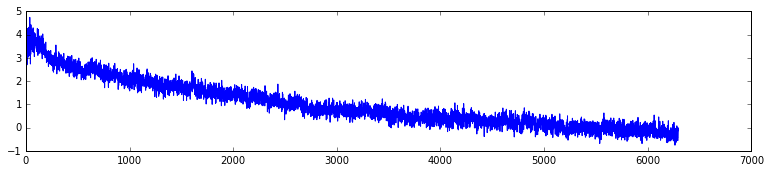


10


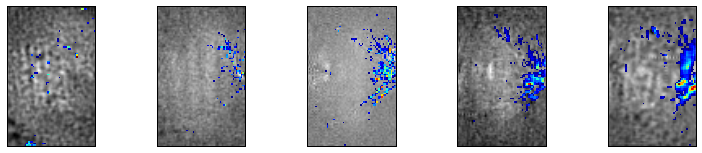

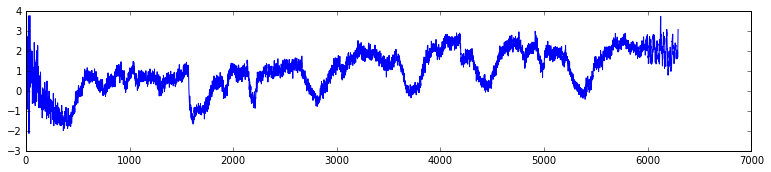


11


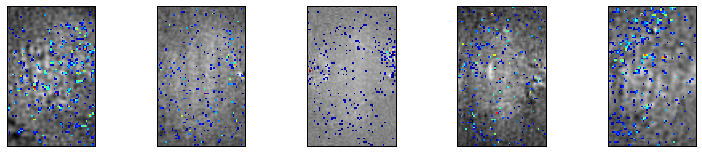

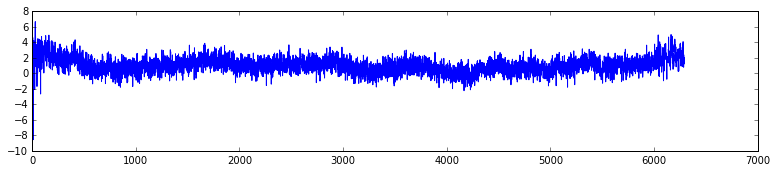


12


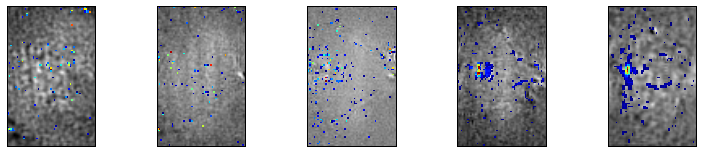

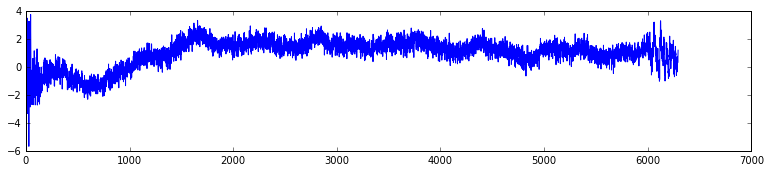


13


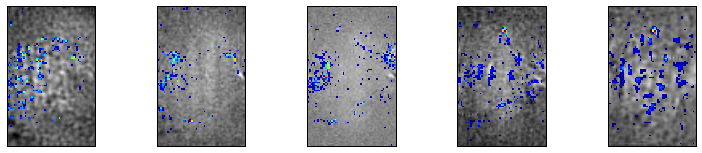

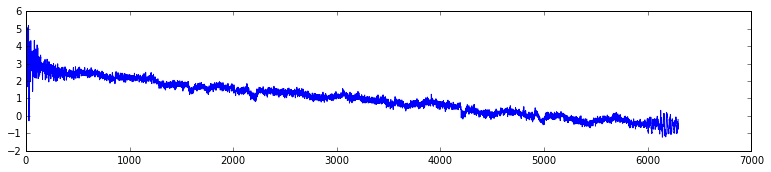

a
14


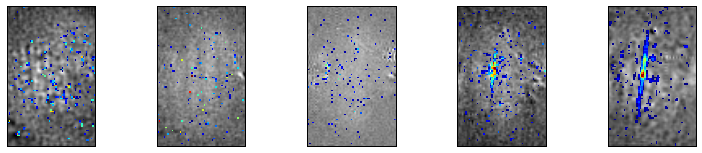

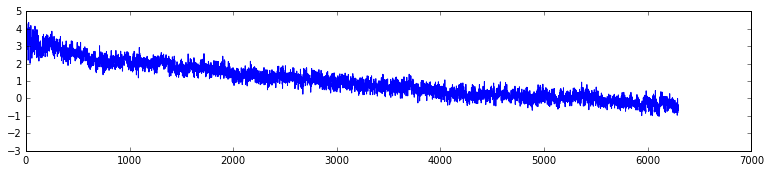


15


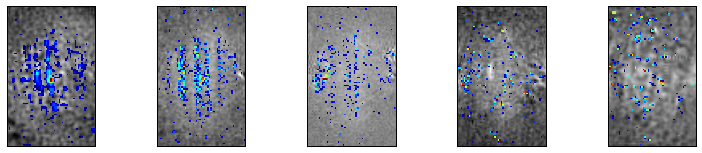

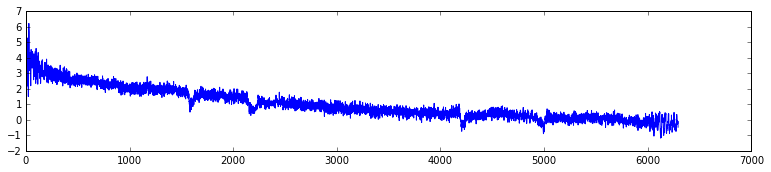


16


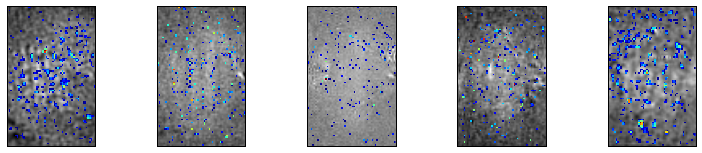

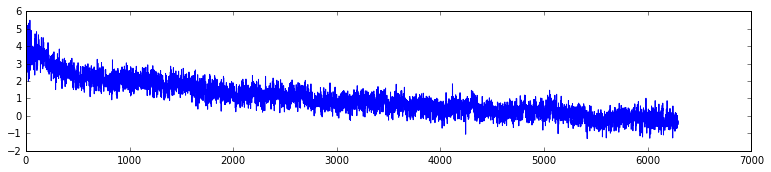


17


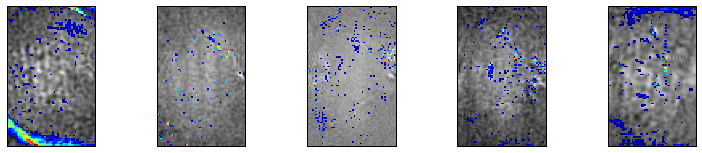

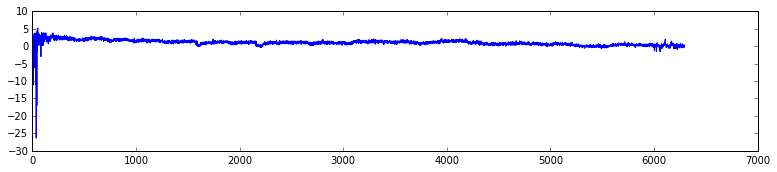


18


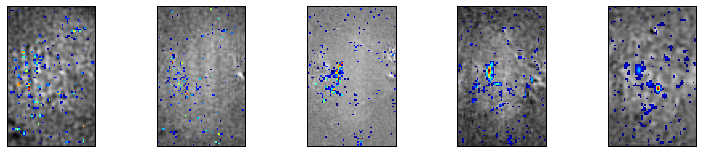

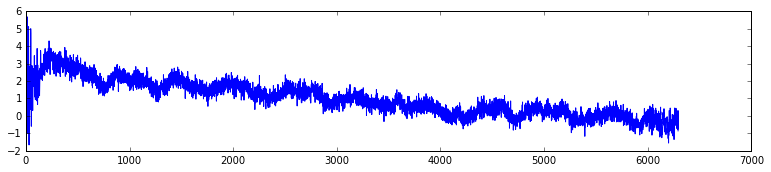

a
19


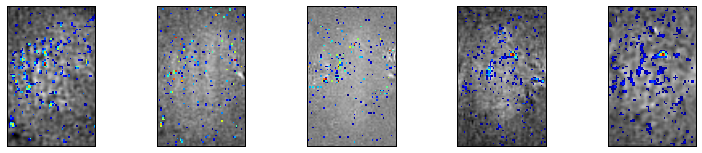

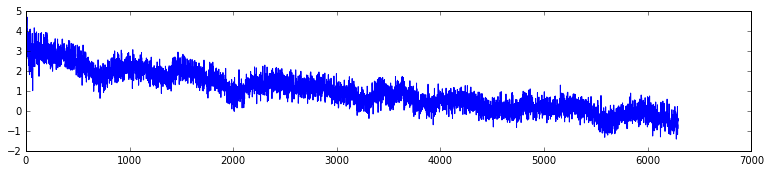

a
20


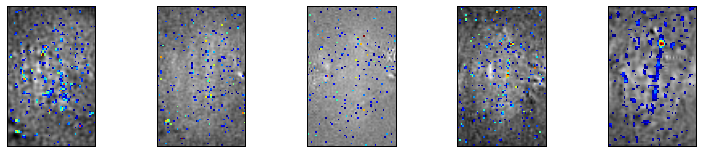

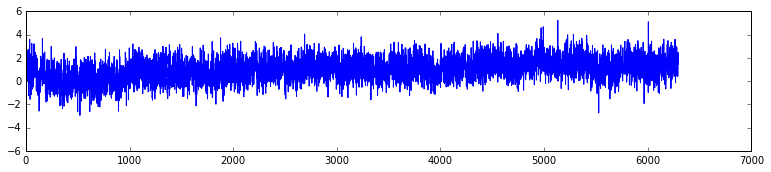


21


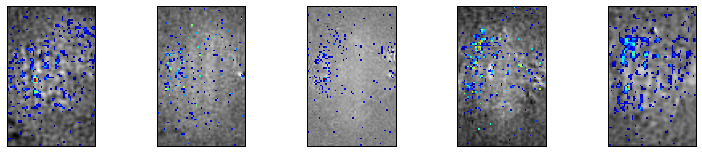

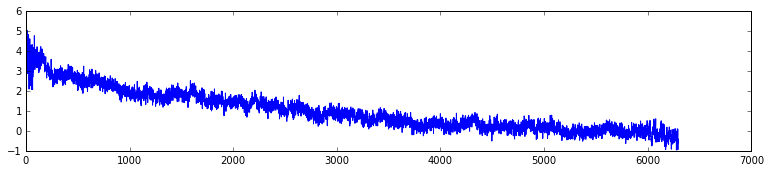

a
22


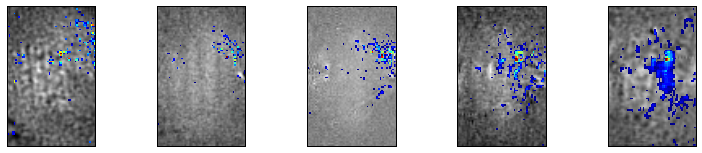

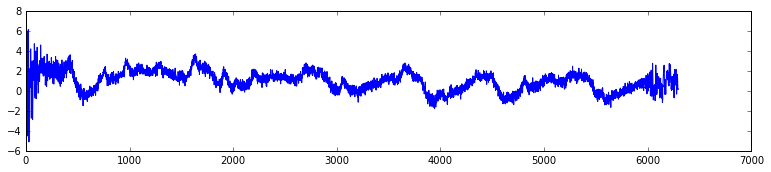


23


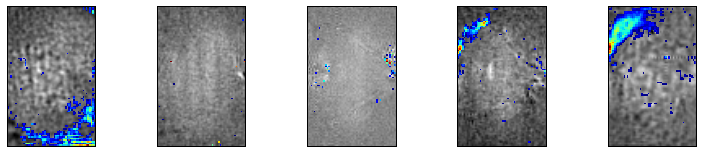

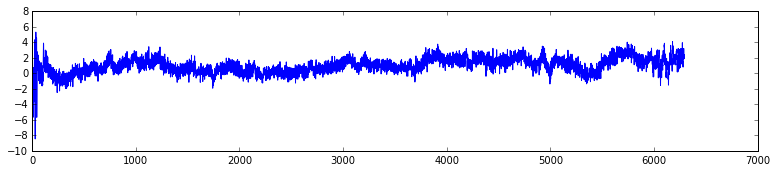


24


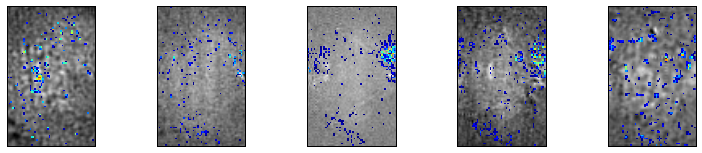

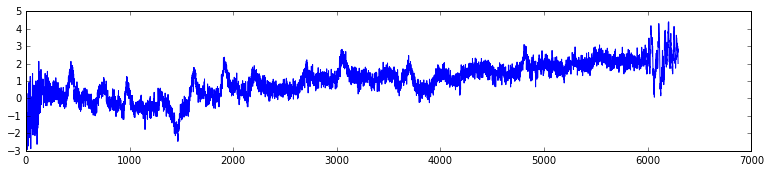


25


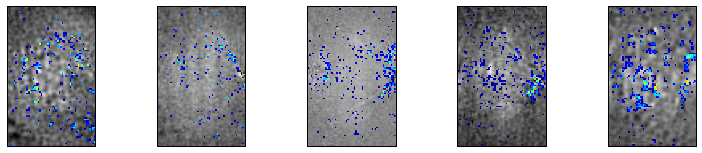

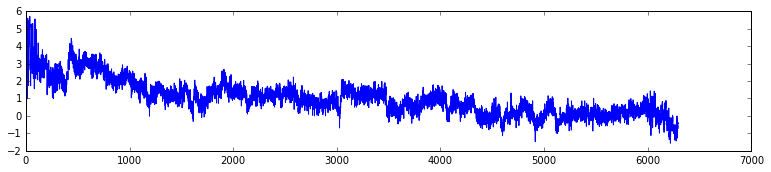


26


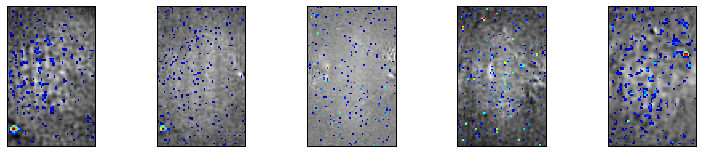

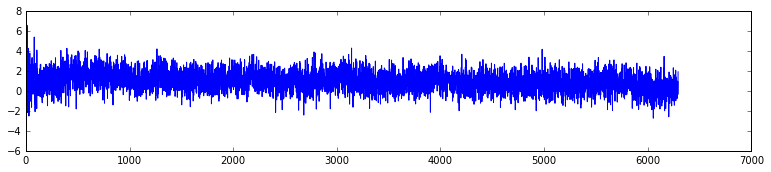


27


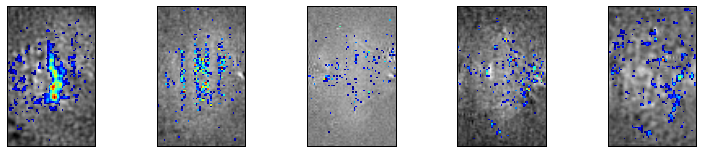

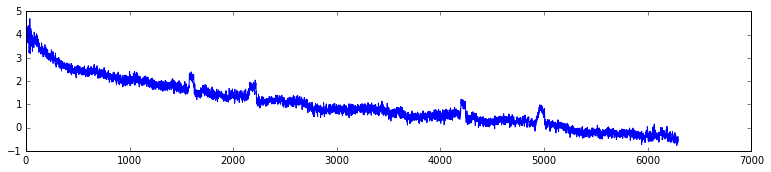


28


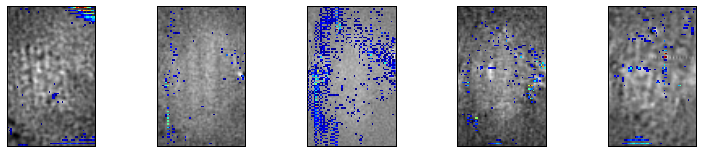

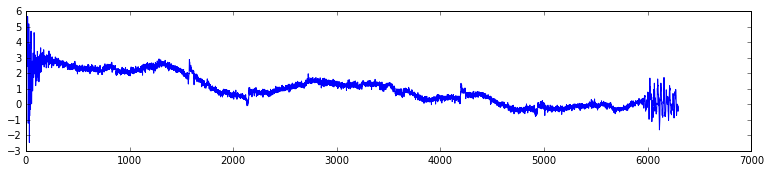


29


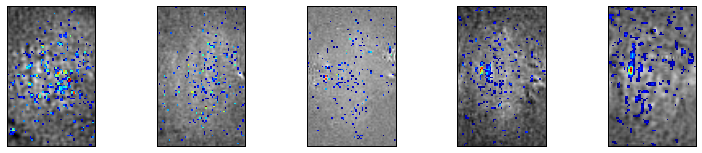

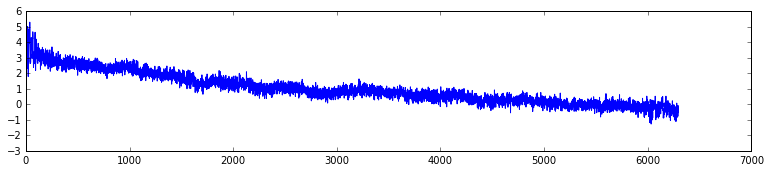


30


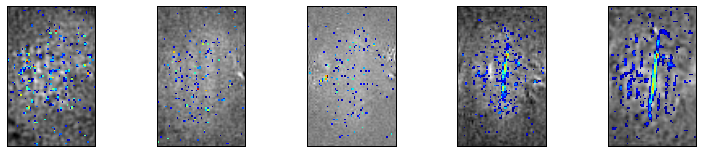

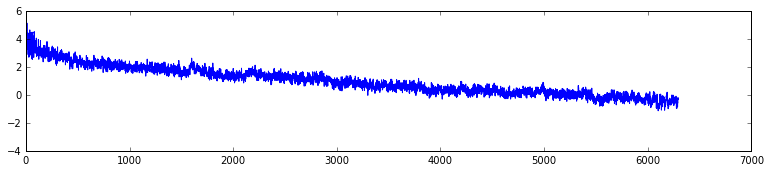


31


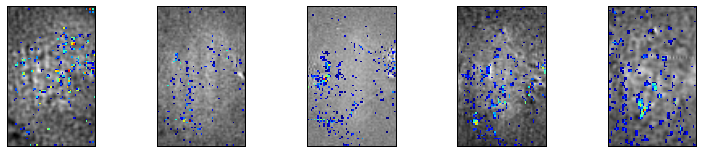

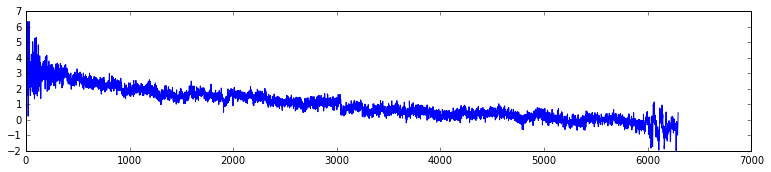


32


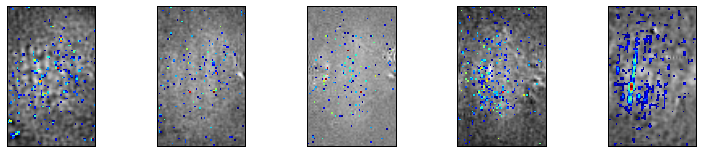

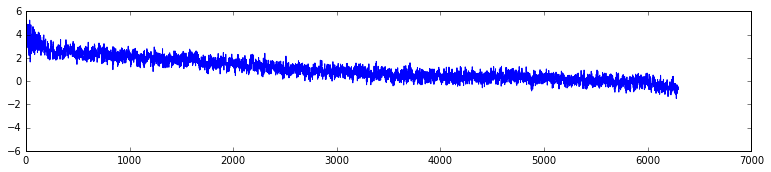


33


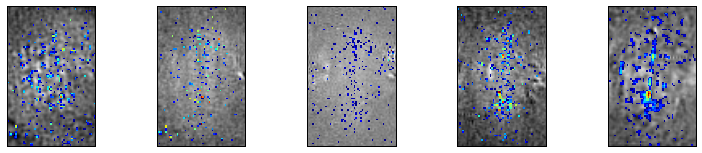

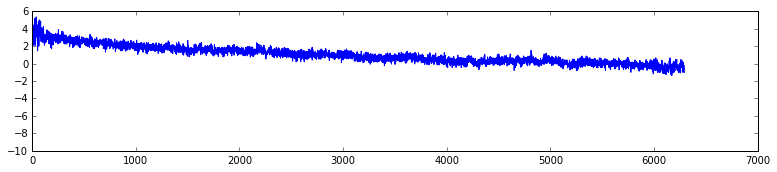


34


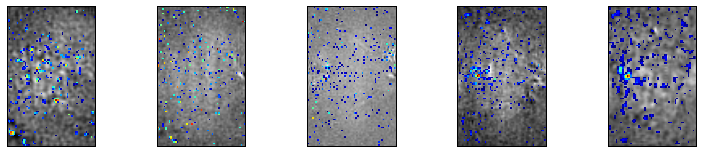

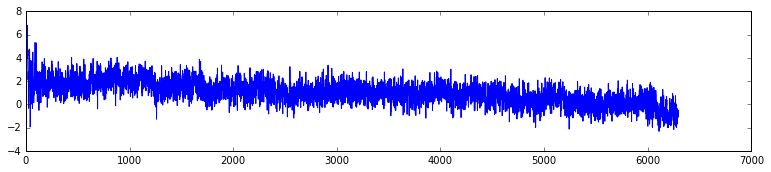


35


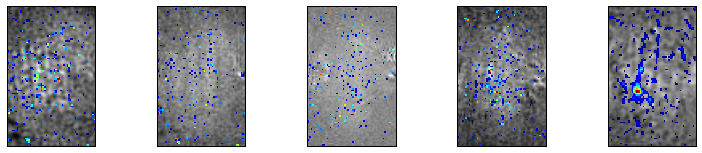

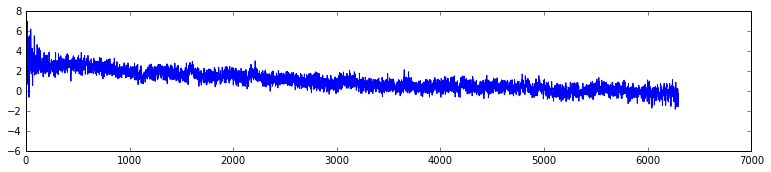


36


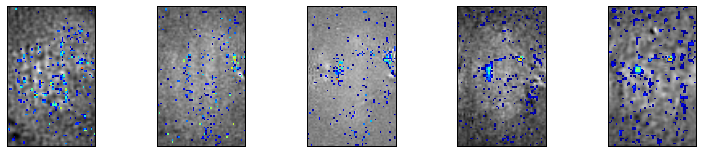

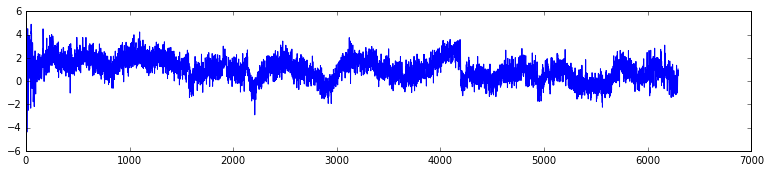


37


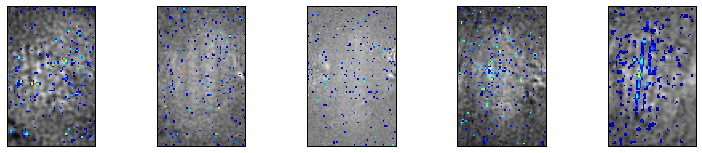

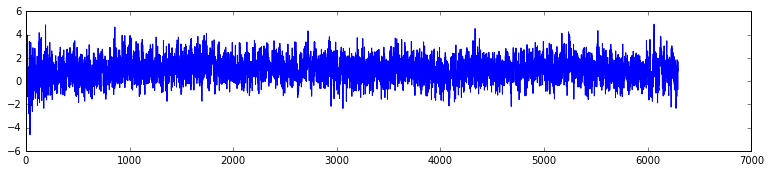


38


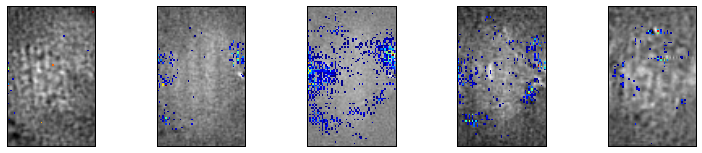

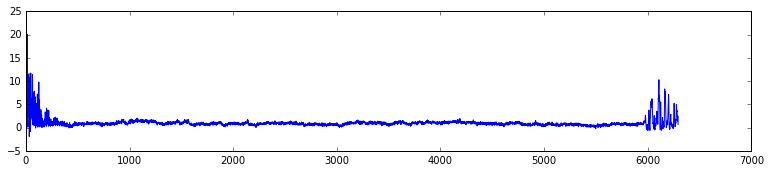


39


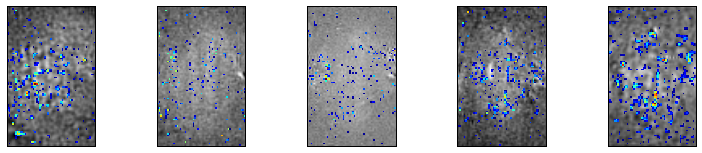

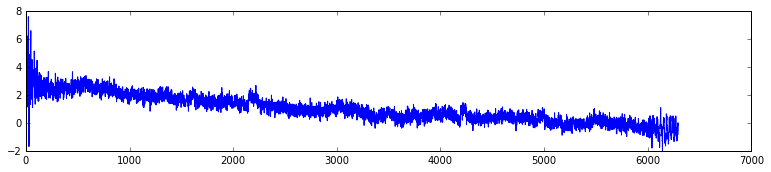


40


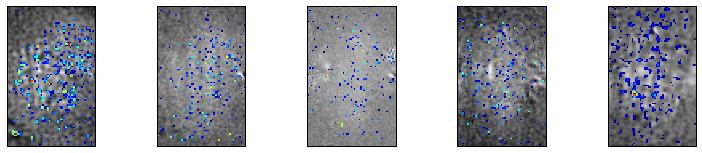

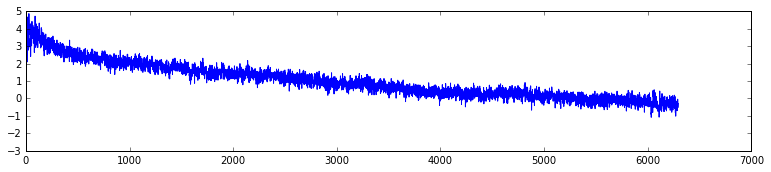


41


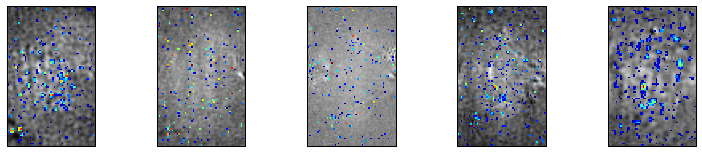

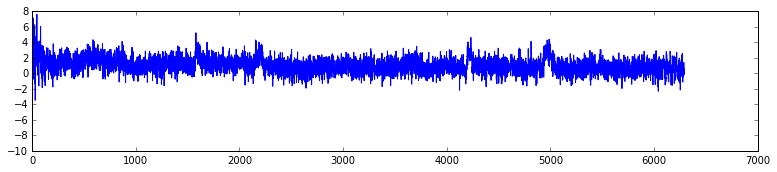


42


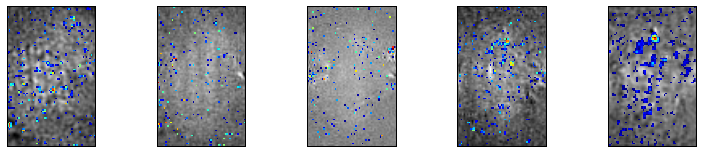

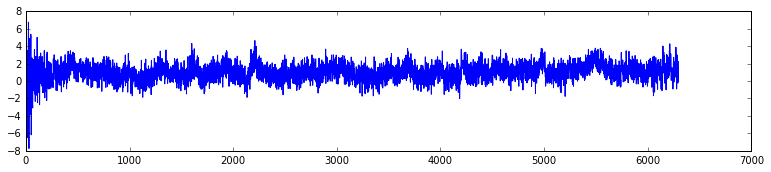


43


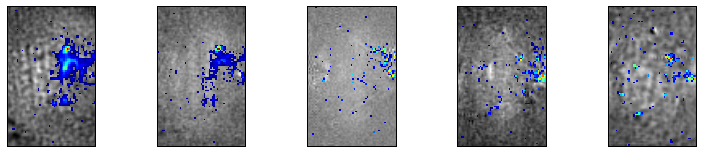

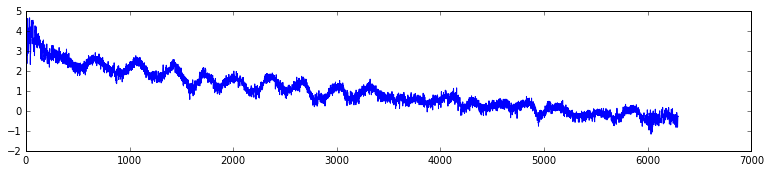

a
44


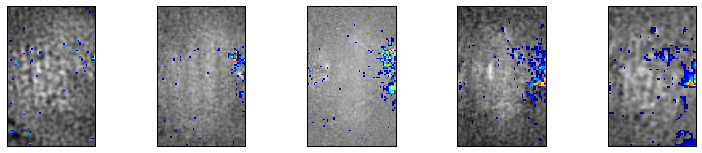

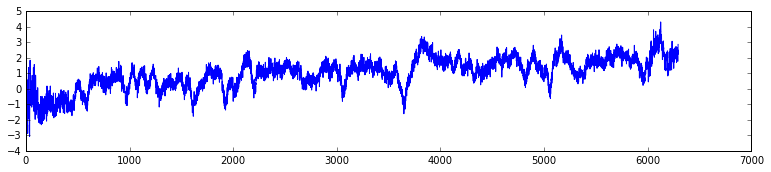


45


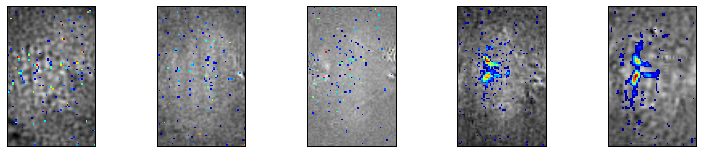

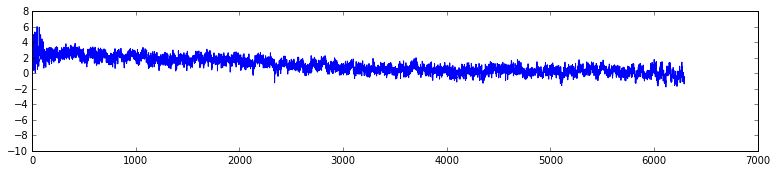

a
46


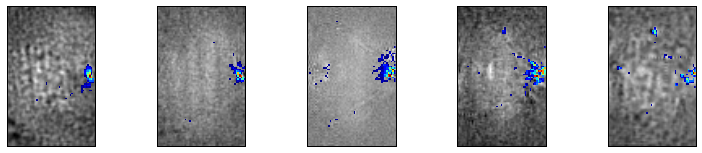

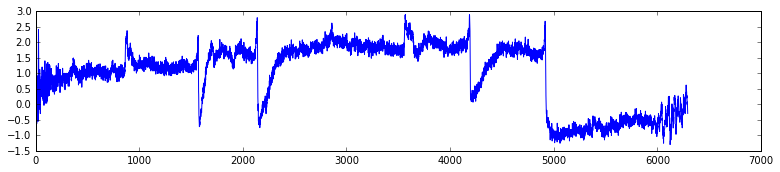


47


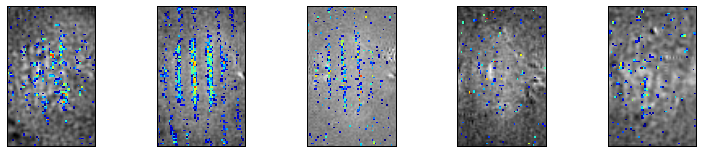

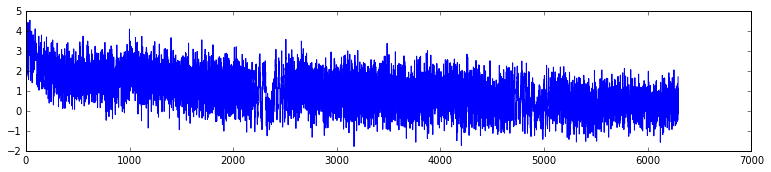


48


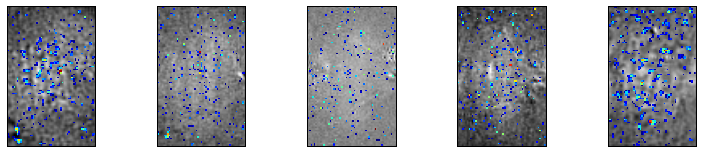

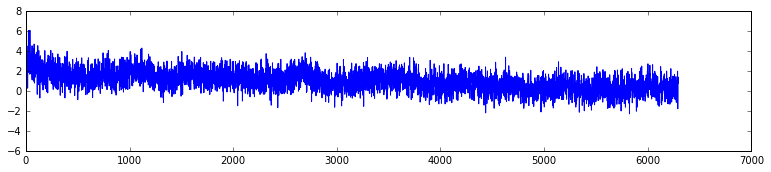


49


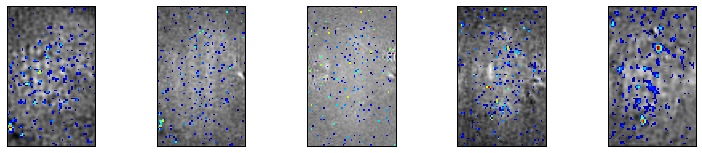

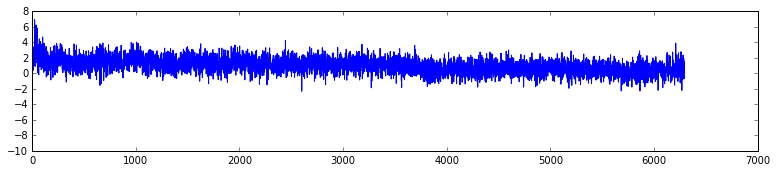


50


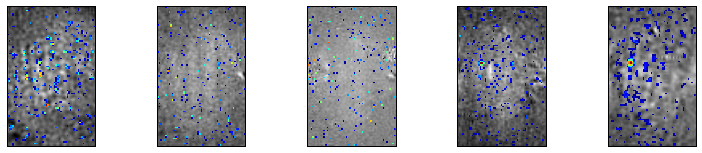

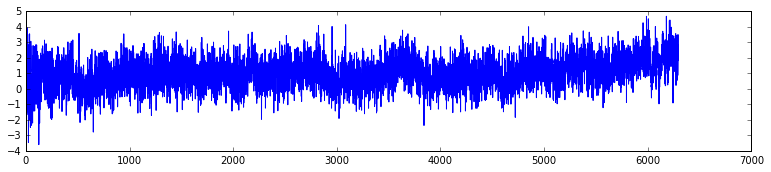


51


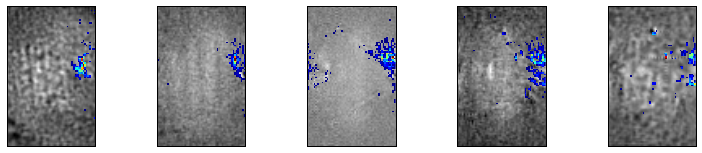

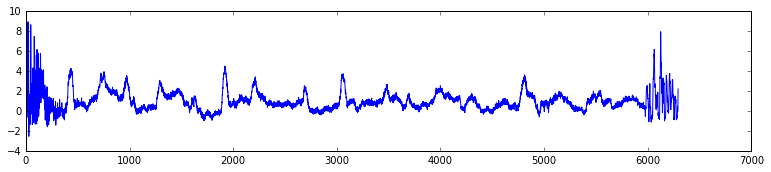


52


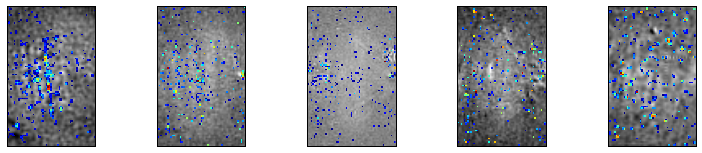

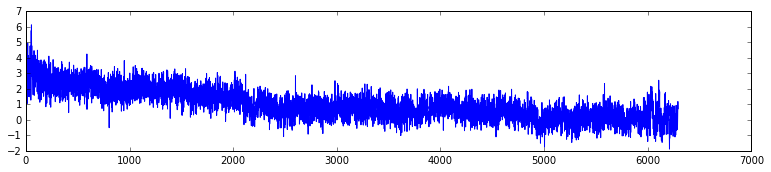


53


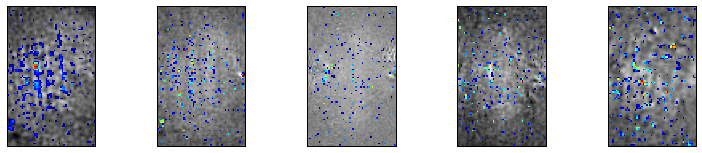

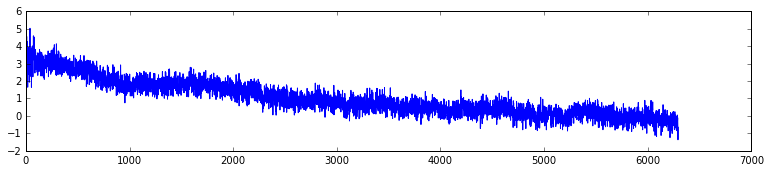


54


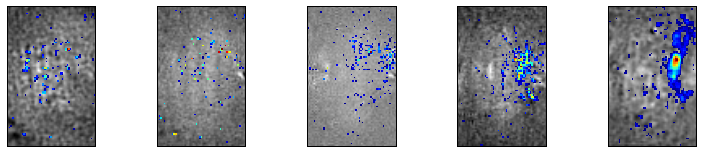

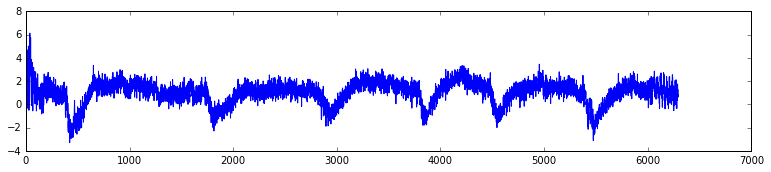


55


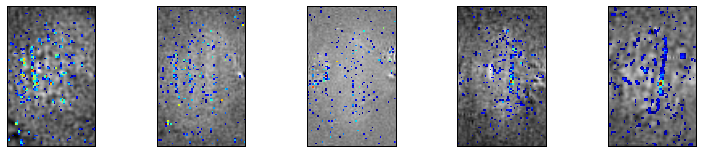

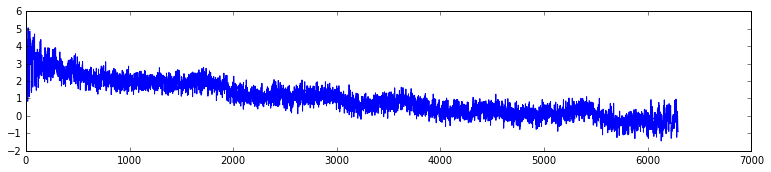


56


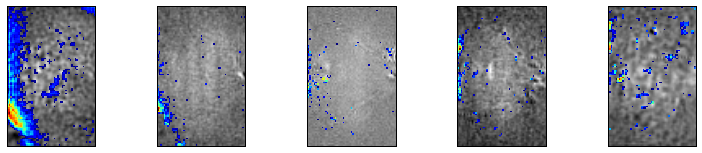

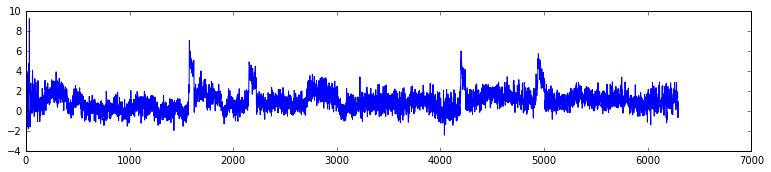


57


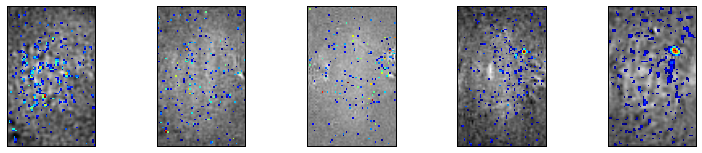

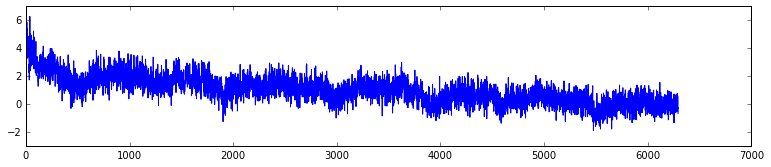


58


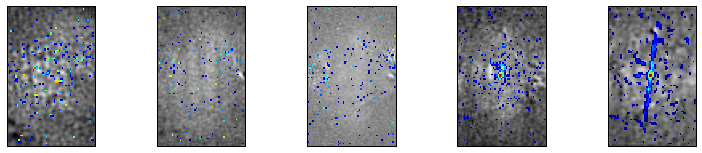

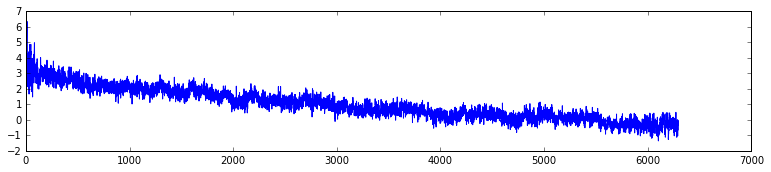


59


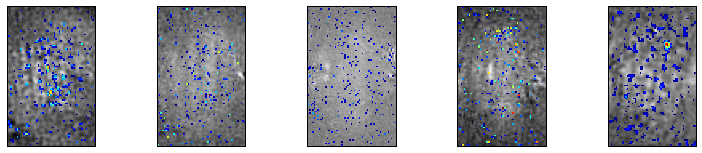

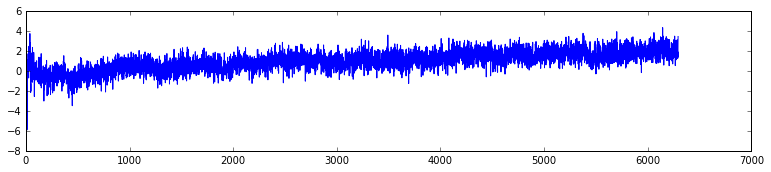


60


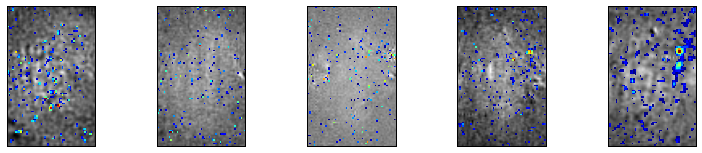

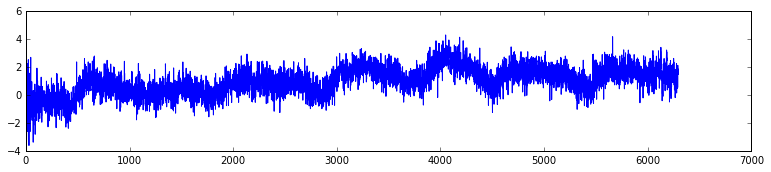


61


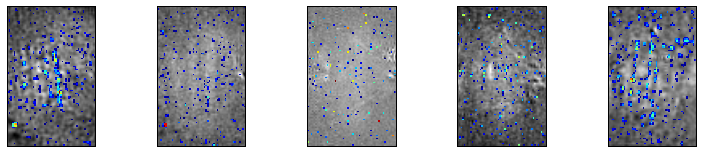

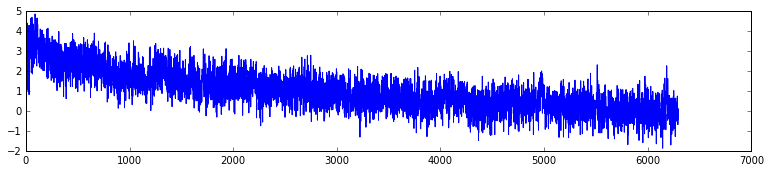


62


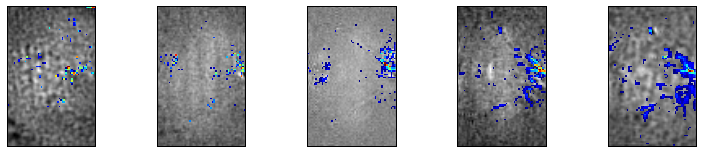

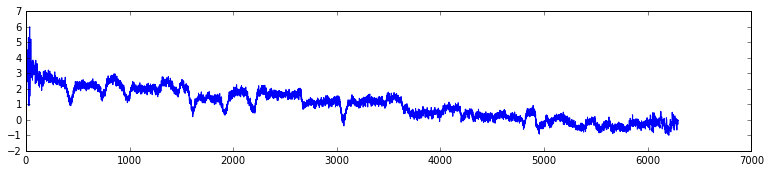


63


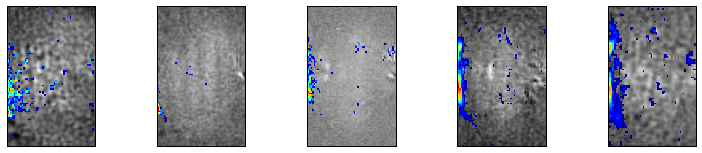

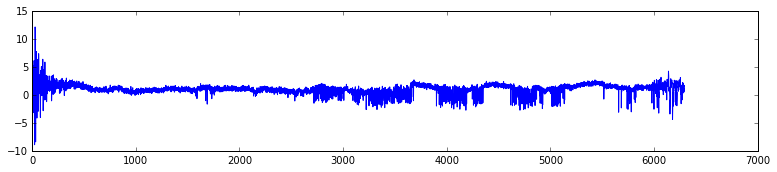


64


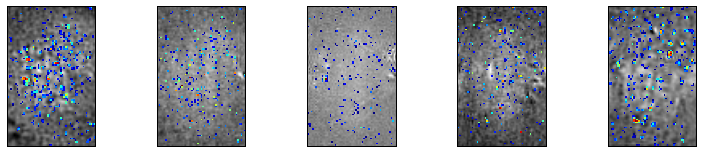

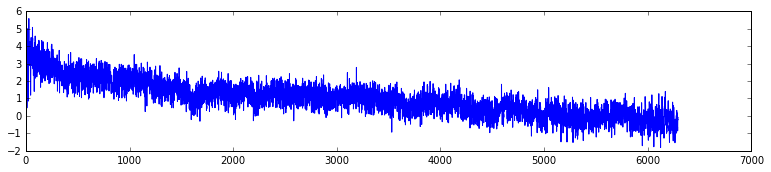


65


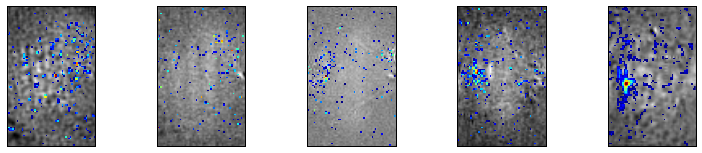

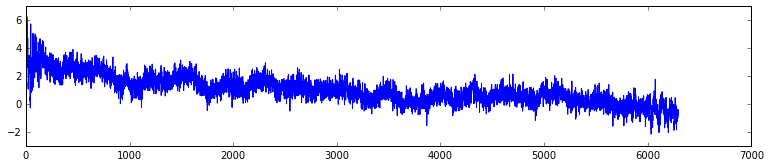


66


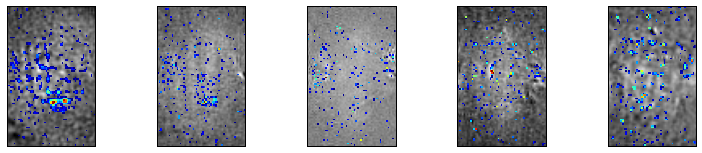

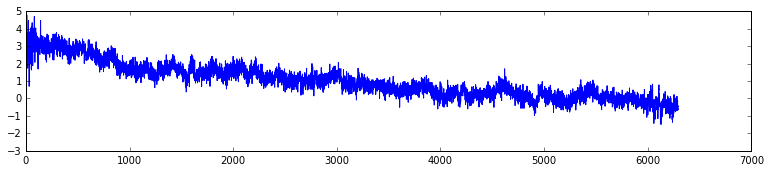


67


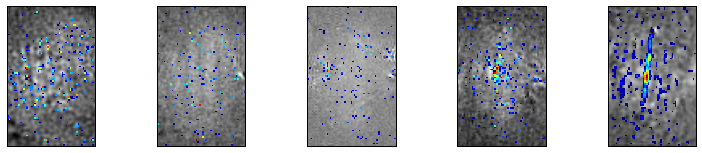

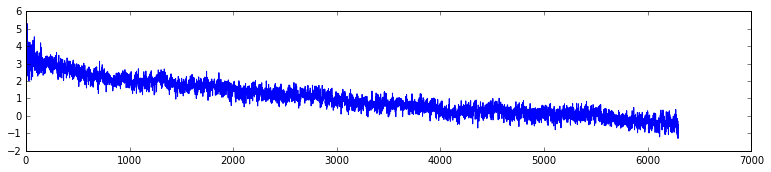


68


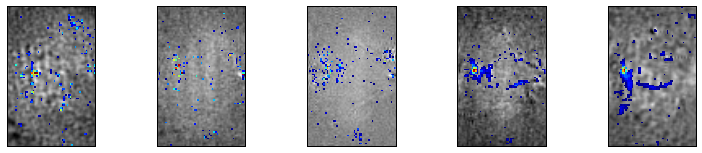

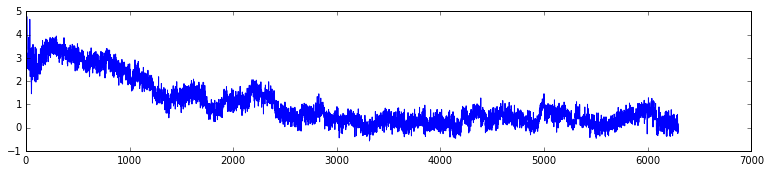

a
69


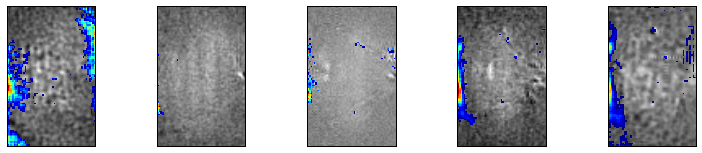

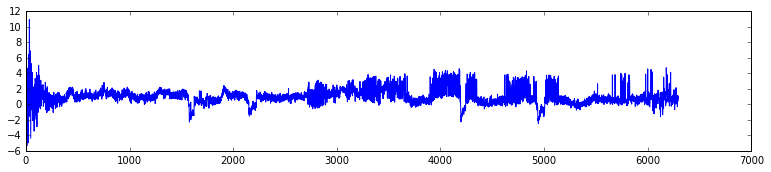


70


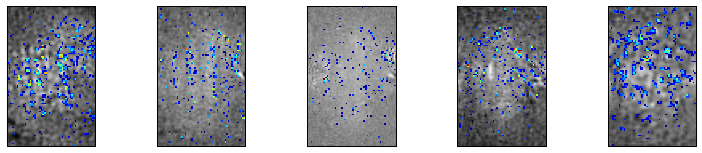

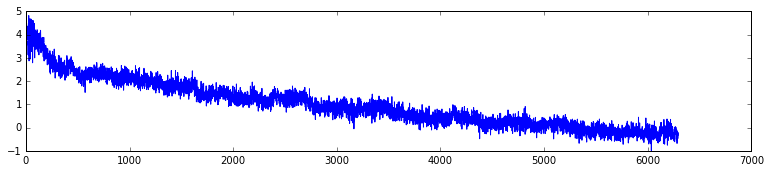


71


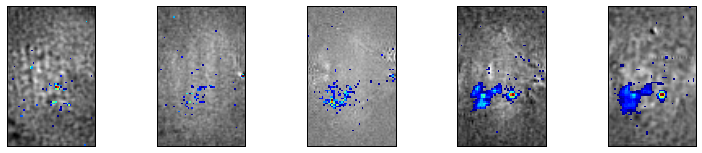

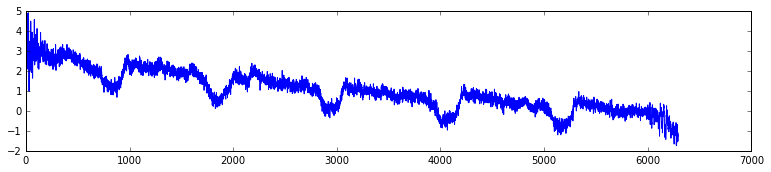

a


In [98]:
for j in range(S[3]):

    if S[2]>5:
        for i in range(Nstack):
            V=Dmaps[:,:,Indices[i],Order[j]]
            D1[:,:,i]=np.max(V,2)
        D2[:,:,:,j]=D1
        D1[D1==0]=np.nan
           
    else:
        for i in range(S[2]):
            V=Dmaps[:,:,i,Order[j]]
            D1[:,:,i]=V 
            

    print(j)
    for i in range(Nstack):
        plt.subplot(1,5,i+1)
        plt.imshow(Dmean[:,:,i],cmap=plt.cm.gray)
        plt.imshow(D1[:,:,i], cmap=my_cmap,interpolation='none')
        frame1 = plt.gca()
        frame1.axes.get_xaxis().set_visible(False)
        frame1.axes.get_yaxis().set_visible(False)
        
    plt.show()
    
    #plt.plot(TS_ROI[:,Order[j]]/np.sqrt(np.var(TS_ROI[:,Order[j]])))
    plt.plot(DT[:,Order[j]]/np.sqrt(np.var(DT[:,Order[j]]))+1)

    #plt.plot(Tb,Rightb+0.5, marker='o')
    #plt.plot(Tb,Leftb)
    #plt.plot(Tstim,UV+0.3, marker='o')
    #plt.plot(Tstim,Odor+0.3,marker='o')
    plt.show()
    
    Label_ICs.append(raw_input())
    if Label_ICs[j]=='':
        Good_ICs[j]=0
    else:
        Good_ICs[j]=1
        
        

In [99]:
Dmaps.shape

(87, 55, 36, 72)

In [100]:
Label_ICs

['',
 'a',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 'a',
 '',
 '',
 '',
 '',
 'a',
 'a',
 '',
 'a',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 'a',
 '',
 'a',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 'a',
 '',
 '',
 'a']

In [101]:
set(Label_ICs)

{'', 'a'}

In [102]:
if len(Label_ICs)<S[3]:
    for j in range(S[3]-len(Label_ICs)):
      Label_ICs.append('')  

In [103]:
Dict={'a':0,'AL':0,'Co':1,'CO':1,'O':2,'o':2,'OG':3,'AVLP':3,'A':0,'G':5,'PN':5,'CA':6,'Ca':6,'L':4,'LH':6,'l':6,'KC':7,'kc':7,'M':7,'MB':1,'mb':1,'FB':2,'EB':3,'eb':8,'C':4,'c':8,'PB':9,'pb':9,'AMMC':10,'ammc':10,'V':5,'PS':11,'S':11,'SOG':11,'s':11,'PI':12,'I':12,'i':12,'D':5,'':14,'0':14}

In [104]:
Translated=[Dict[X] for X in Label_ICs]

In [105]:
G=Good_ICs.tolist();

In [106]:
len(Good_ICs)

72

In [107]:
G.count(1)

9

In [108]:
where_are_NaNs = np.isnan(D2)

D2[where_are_NaNs] = 0

In [109]:
if S[2]>5:
    Final_map=np.zeros([S[0],S[1],5,3])
    Fmaps=np.zeros([S[0],S[1],5,3])
else:
    Final_map=np.zeros([S[0],S[1],3])
    Fmaps=np.zeros([S[0],S[1],3])    
C=np.zeros([S[3],3])

In [110]:
D2.shape

(87, 55, 5, 72)

In [111]:
S

(87, 55, 36, 72)

In [112]:
for j in range(S[3]):    
    if Good_ICs[j]:
        C[j,:]=np.squeeze(np.random.rand(3,1))
        for k in range(3):
            M=np.max(np.squeeze(np.reshape(D2[:,:,:,j],S[0]*S[1]*5)))
            #M[M==0]=1
  #          Fmaps[:,:,:,k]=0.7*Dmaps[:,:,:,j]*C[j,k]/np.max(np.squeeze(np.reshape(Dmaps[:,:,:,j]*np.max(C[j,:],S[0]*S[1]*5))
            Fmaps[:,:,:,k]=0.6*D2[:,:,:,j]*C[j,k]/(M*np.max(C[j,:]))
        Final_map=Final_map+Fmaps

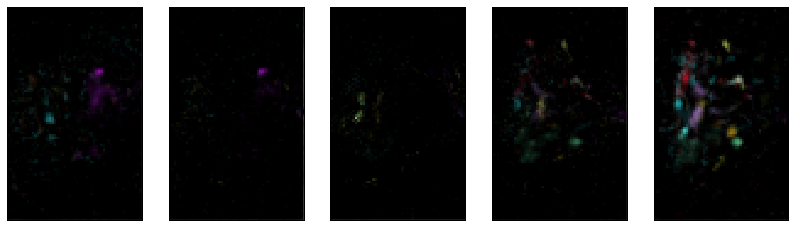

In [113]:
pylab.rcParams['figure.figsize'] = (14, 5)

#Final_map[Final_map<0.1]=np.NaN

if S[2]>5:
    N=Nstack
else:
    N=S[2]
for i in range(N):
        plt.subplot(1,N,i+1)
        plt.imshow(Dmean[:,:,i],cmap=plt.cm.gray)
        plt.imshow(Final_map[:,:,i],interpolation='none')
        #plt.imshow(Final_map[:,:,i]) 
        frame1 = plt.gca()
        frame1.axes.get_xaxis().set_visible(False)
        frame1.axes.get_yaxis().set_visible(False)

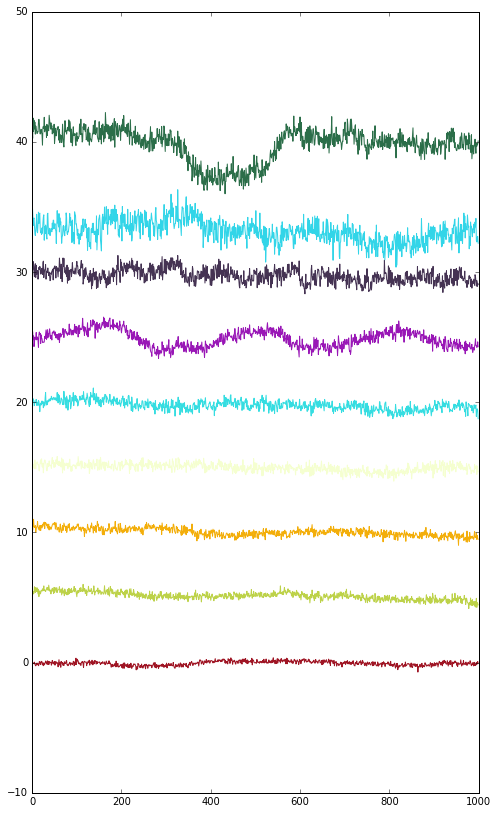

In [117]:
pylab.rcParams['figure.figsize'] = (8, 14)
h=5
i=0

for j in range(S[3]):
    if Good_ICs[j]:
        plt.plot((DT[2500:3500,Order[j]]/np.sqrt(np.var(DT[:,j]))+h*i),color=C[j,:])
        i=i+1

plt.show()

In [58]:
List1=[(Translated[i],i) for i in range(S[3])]

In [141]:
Newlist=sorted(List1, key=lambda List1: List1[0])

In [142]:
Neworder=[Newlist[i][1] for i in range(S[3])  if Newlist[i][0] != 14]

In [143]:
Neworder

[22,
 24,
 34,
 39,
 42,
 57,
 176,
 227,
 12,
 19,
 28,
 29,
 36,
 43,
 52,
 60,
 72,
 128,
 138,
 259,
 267,
 268,
 274,
 285,
 61,
 79,
 88,
 198,
 214,
 215,
 229,
 279,
 10,
 16,
 18,
 82,
 134,
 284,
 295,
 296,
 9,
 14,
 23,
 27,
 32,
 35,
 41,
 46,
 48,
 49,
 65,
 94,
 107,
 263,
 269,
 271,
 275,
 288,
 294,
 298,
 1,
 20,
 106,
 132,
 248,
 252,
 0,
 2,
 17,
 51,
 54,
 140,
 175,
 187,
 232,
 273,
 278,
 292,
 6,
 25,
 33,
 37,
 38,
 53,
 75,
 121,
 241,
 289,
 293,
 58,
 73,
 129,
 238,
 3,
 5,
 7,
 21,
 31,
 40,
 59,
 282,
 297,
 299,
 69,
 117]

In [144]:
Order[Neworder]

array([119,  12,  89, 133, 100,   2,  40, 184, 242, 109,  26, 240, 134,
        36,  86, 162, 241,   1,   7, 111,  23,  14, 211,  38, 154, 132,
        19, 139, 199,  46, 268,  31,  83,  78, 161, 257,  96,  32,  65,
       146, 170,  10,  90, 128,  79,  35,   3, 198, 277,   5,  24,  87,
        74,  69, 252,  21, 288,   4, 228, 255,   6,  16, 151, 204, 182,
       223,  11,   8, 207,  53,   0, 108,  17, 153,  80,  22,  44,  49,
        37,  63,  20,  67,  47,  29, 188, 209, 190,  61,  77,  39,  95,
        92,  50,  13, 122,  52,  56,  73,  27,  66,  88,   9,  97, 219, 233])

In [145]:
[Label_ICs[Neworder[i]] for i in range(len(Neworder))]  

['AL',
 'AL',
 'AL',
 'AL',
 'AL',
 'AL',
 'AL',
 'A',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'EB',
 'EB',
 'EB',
 'EB',
 'EB',
 'EB',
 'EB',
 'EB',
 'L',
 'L',
 'L',
 'L',
 'L',
 'L',
 'L',
 'L',
 'PN',
 'PN',
 'PN',
 'PN',
 'PN',
 'PN',
 'PN',
 'PN',
 'D',
 'PN',
 'PN',
 'PN',
 'PN',
 'PN',
 'D',
 'PN',
 'D',
 'PN',
 'PN',
 'PN',
 'LH',
 'Ca',
 'LH',
 'LH',
 'Ca',
 'LH',
 'KC',
 'KC',
 'KC',
 'KC',
 'KC',
 'KC',
 'KC',
 'KC',
 'KC',
 'KC',
 'KC',
 'KC',
 'PB',
 'PB',
 'PB',
 'PB',
 'PB',
 'PB',
 'PB',
 'PB',
 'PB',
 'PB',
 'PB',
 'AMMC',
 'AMMC',
 'AMMC',
 'AMMC',
 'PS',
 'PS',
 'PS',
 'PS',
 'PS',
 'PS',
 'PS',
 'PS',
 'PS',
 'PS',
 'PI',
 'PI']

In [146]:
NewDT=DT[:,Order[Neworder[:]]].T

In [147]:
NewDT.shape

(105, 6127)

In [148]:
for j in range(len(Neworder)):
    A=NewDT[:,j]
    V=np.sqrt(np.var(A))
    NewDT[:,j]=A/V

In [149]:
C1=np.zeros([6,3])
C1[0][:]=(1,0,0)
C1[1][:]=(0,1,0)
C1[2][:]=(0,0,1)
C1[3][:]=(0.8,0.8,0)
C1[4][:]=(0,1,1)
C1[5][:]=(1,0,1)

In [150]:
S1=DT.shape
S1

(6127, 300)

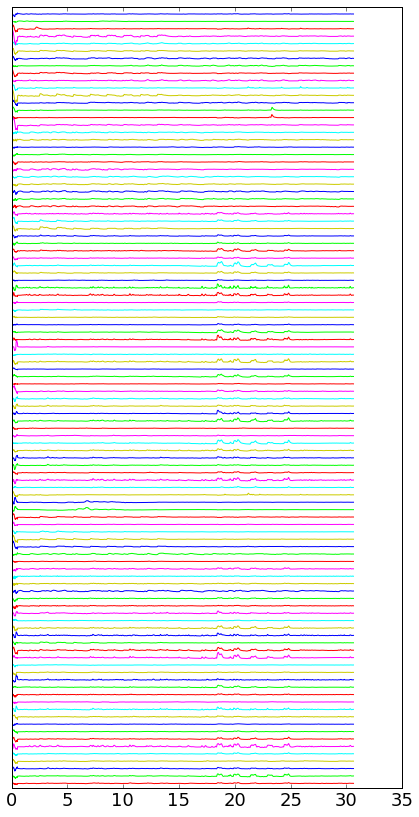

In [151]:
h=5
pylab.rcParams['figure.figsize'] = (7, 14)
i=0
t=[j*0.005 for j in range(S1[0])]

for j in range(len(Neworder)):
        plt.plot(t,NewDT[j,:]+h*j,color=C1[i%6][:])
        i=i+1
plt.ylim([-3,h*j+5])

frame1=plt.gca()
frame1.axes.get_yaxis().set_ticks([])
matplotlib.rcParams.update({'font.size': 18})
plt.show()

In [152]:
Newmaps=Dmaps[:,:,:,Order[Neworder[:]]]

In [153]:
L=len(set([Translated[Neworder[i]] for i in range(len(Neworder))]))

In [154]:
[Translated[Neworder[i]] for i in range(len(Neworder))]

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 6,
 6,
 6,
 6,
 6,
 6,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 10,
 10,
 10,
 10,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 12,
 12]

In [155]:
Regionmaps=np.zeros([S[0],S[1],L,3])
Datasort=np.zeros([S[0],S[1],S[2],L,3])

In [156]:
Regionname=[]

In [157]:
Newmaps.shape

(101, 88, 37, 105)

In [158]:
Nstack

5

In [159]:
Mapsordered=datao[:,:,:,Neworder[:]]
mapfilename=foldername+'mapsordered.nii'
Mapsordered2=np.transpose(Mapsordered,(3,2,1,0))
nimap = NiftiImage(Mapsordered2)
nimap.save(mapfilename)

NameError: name 'foldername' is not defined

In [ ]:
DMapsordered=Dmapso[:,:,:,Neworder[:]]
mapfilename=foldername+'zscoredmapsordered.nii'
DMapsordered2=np.transpose(DMapsordered,(3,2,1,0))
nimap = NiftiImage(DMapsordered2)
nimap.save(mapfilename)

In [ ]:
j=0
i=0
k=Translated[Neworder[i]]
m=0
Regionname.append(Label_ICs[Neworder[i]])
for i in range(len(Neworder)):
    #C2=C1[i%6][:]
    for l in range(3):
        M=np.max(np.squeeze(np.reshape(Newmaps[:,:,:,i],S[0]*S[1]*S[2])))
        Regionmaps[:,:,j,l]=Regionmaps[:,:,j,l]+0.7*np.max(DMapsordered[:,:,:,i],2)*C1[i%6][l]/M
        Datasort[:,:,:,j,l]=Datasort[:,:,:,j,l]+Dmaps[:,:,:,Order[Neworder[i]]]*C1[i%6][l] 
    i=i+1
    m=m+1
    if i<len(Neworder):
        k1=Translated[Neworder[i]]
        
    if k1 != k:
        j=j+1
        k=k1
        m=0
        Regionname.append(Label_ICs[Neworder[i]])

In [ ]:
Regionname

In [ ]:
Datasort.shape

In [160]:
DMapscolor=np.sum(Datasort, axis=3)
DMapscolor.shape

(101, 88, 37, 3)

In [162]:
mapfilename='zscoredmapscolor.nii'
DMapscolor2=np.transpose(DMapscolor,(3,2,1,0))

In [163]:
DMapscolor2.shape

(3, 37, 88, 101)

In [164]:
nimap = NiftiImage(DMapscolor2)
nimap.save(mapfilename)

/usr/lib/pymodules/python2.7/nifti/image.py:231: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  return (not self._data == None)


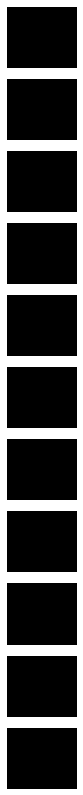

In [165]:
pylab.rcParams['figure.figsize'] = (7, 14)
import scipy
from scipy import ndimage

for i in range(L):
        plt.subplot(L,1,L-i)
        Rotated_Plot = ndimage.rotate(Regionmaps[:,:,i], -90)
        IM=plt.imshow(Rotated_Plot) 
        frame1 = plt.gca()
        frame1.axes.get_xaxis().set_visible(False)
        frame1.axes.get_yaxis().set_visible(False)
        

In [473]:
import scipy.io as sio
sio.savemat(foldername+'NewDT.mat',{'NewDT':NewDT})

In [474]:
names=set([Label_ICs[Neworder[i]] for i in range(len(Neworder))])  
for i in range(L):
    regionfilename=foldername+Regionname[i]+'.nii'
    D3=np.transpose(Datasort[:,:,:,i,:],(2,3,1,0))
    nim = NiftiImage(D3)
    nim.save(regionfilename)

In [171]:
%notebook -e 964KF.ipynb

In [173]:
%store

Stored variables and their in-db values:
